# Week 5 Lab: Data Augmentation

**CS 203: Software Tools and Techniques for AI**  
**IIT Gandhinagar**

---

## Learning Objectives

By the end of this lab, you will be able to:

1. Apply image augmentation techniques using Albumentations
2. Perform text augmentation using nlpaug
3. Understand audio augmentation with audiomentations
4. Design appropriate augmentation pipelines for different tasks
5. Measure the impact of augmentation on model performance

---

## Netflix Movie Theme

We'll augment our movie data to improve model performance:
- **Movie posters**: Image augmentation for genre classification
- **Movie reviews**: Text augmentation for sentiment analysis
- **Audio clips**: Audio augmentation for trailer classification

---

## Part 1: Environment Setup

In [ ]:
# Install required packages
!pip install albumentations opencv-python-headless pillow
!pip install nlpaug transformers
!pip install torch torchvision torchaudio
!pip install matplotlib seaborn pandas numpy soundfile

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.5/410.5 kB 5.6 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import warnings
warnings.filterwarnings('ignore')
import requests # Added for downloading image
from io import BytesIO # Added for image processing

# Set random seed for reproducibility
np.random.seed(42)

print("All imports successful!")

All imports successful!


---

## Part 2: Image Augmentation with Albumentations

### 2.1 Creating Sample Images

Successfully loaded Interstellar poster from URL.


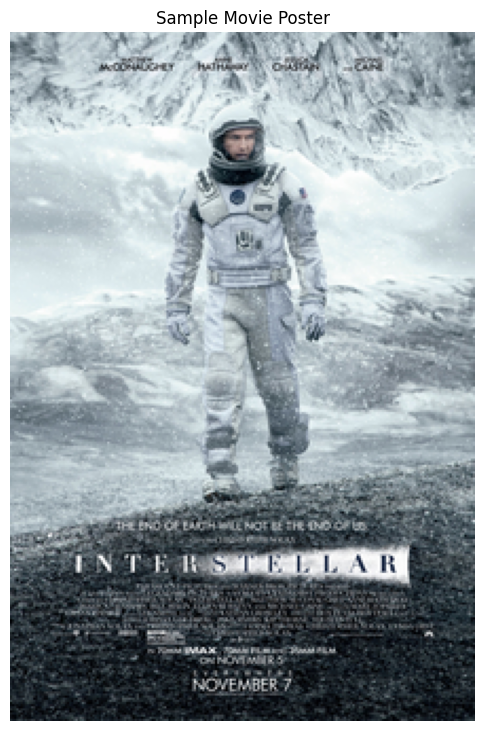

Image shape: (326, 220, 3)


In [ ]:
# Load Interstellar movie poster image from Wikimedia
image_url = "https://upload.wikimedia.org/wikipedia/en/b/bc/Interstellar_film_poster.jpg"

headers = {"User-Agent": "Mozilla/5.0"}
response = requests.get(image_url, headers=headers)
response.raise_for_status()
image_bytes = BytesIO(response.content)
pil_image = Image.open(image_bytes).convert('RGB')
# Convert PIL Image to OpenCV format (BGR numpy array)
sample_image = np.array(pil_image)
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_RGB2BGR)
print("Successfully loaded Interstellar poster from URL.")


plt.figure(figsize=(6, 9))
plt.imshow(cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB))
plt.title("Sample Movie Poster")
plt.axis('off')
plt.show()

print(f"Image shape: {sample_image.shape}")

### 2.2 Basic Albumentations

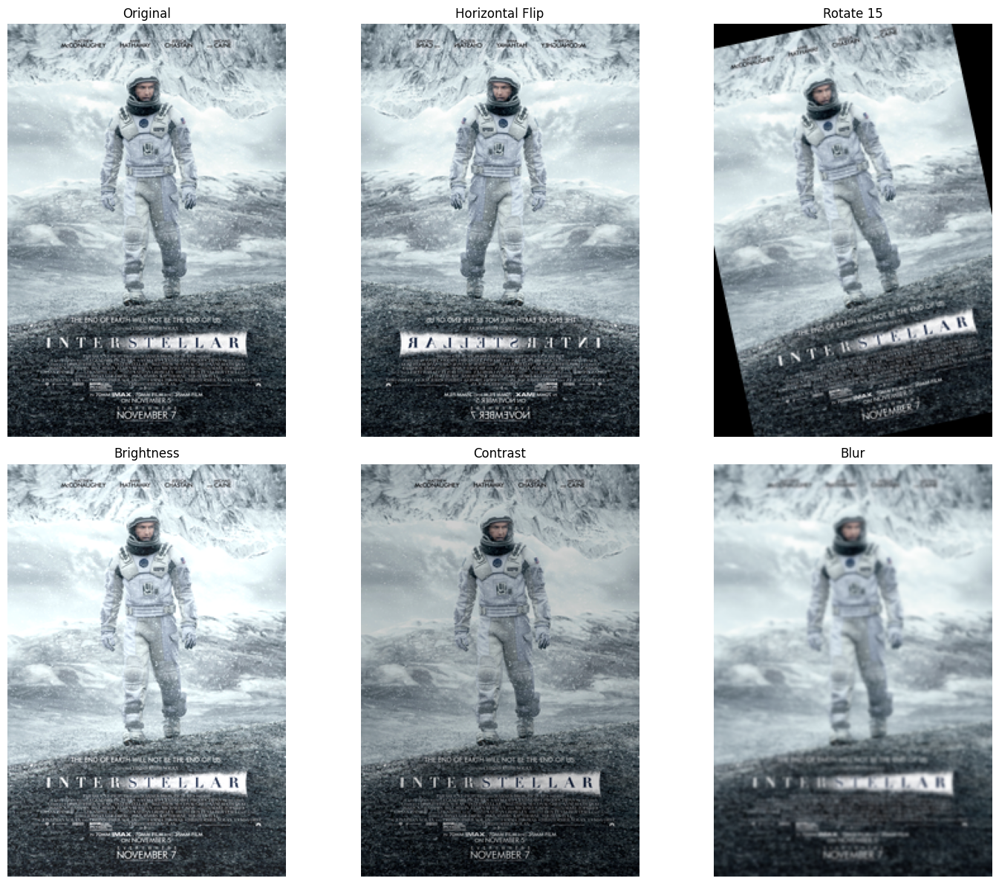

In [ ]:
import albumentations as A

# Define individual transforms
transforms = {
    'Original': None,
    'Horizontal Flip': A.HorizontalFlip(p=1.0),
    'Rotate 15': A.Rotate(limit=15, p=1.0),
    'Brightness': A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0, p=1.0),
    'Contrast': A.RandomBrightnessContrast(brightness_limit=0, contrast_limit=0.3, p=1.0),
    'Blur': A.GaussianBlur(blur_limit=(7, 7), p=1.0),
}

# Apply and display
fig, axes = plt.subplots(2, 3, figsize=(15, 12))
axes = axes.flatten()

for idx, (name, transform) in enumerate(transforms.items()):
    if transform is None:
        augmented = sample_image
    else:
        augmented = transform(image=sample_image)['image']

    axes[idx].imshow(cv2.cvtColor(augmented, cv2.COLOR_BGR2RGB))
    axes[idx].set_title(name, fontsize=12)
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

### Question 2.1 (Solved): Create an Augmentation Pipeline

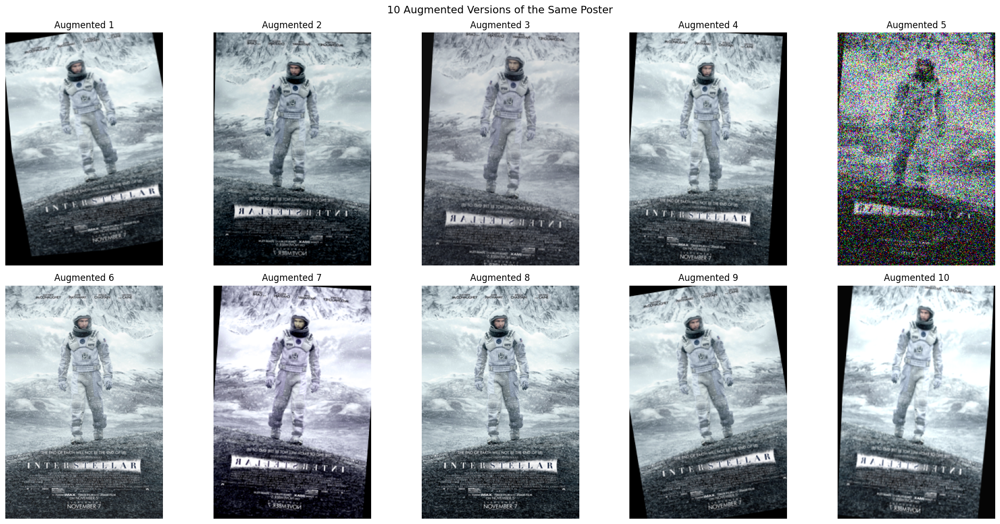

In [ ]:
# SOLVED: Create a composed augmentation pipeline

poster_augmentation = A.Compose([
    # Geometric transforms
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=10, p=0.5),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=5, p=0.5),

    # Color transforms
    A.OneOf([
        A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=1),
        A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=1),
    ], p=0.5),

    # Noise and blur
    A.OneOf([
        A.GaussianBlur(blur_limit=3, p=1),
        A.GaussNoise(var_limit=(10, 50), p=1),
    ], p=0.3),
])

# Generate multiple augmentations
fig, axes = plt.subplots(2, 5, figsize=(20, 10))
axes = axes.flatten()

for i in range(10):
    augmented = poster_augmentation(image=sample_image)['image']
    axes[i].imshow(cv2.cvtColor(augmented, cv2.COLOR_BGR2RGB))
    axes[i].set_title(f"Augmented {i+1}")
    axes[i].axis('off')

plt.suptitle("10 Augmented Versions of the Same Poster", fontsize=14)
plt.tight_layout()
plt.show()

### Question 2.2: Create a Domain-Specific Augmentation Pipeline

Create an augmentation pipeline specifically for movie poster genre classification.

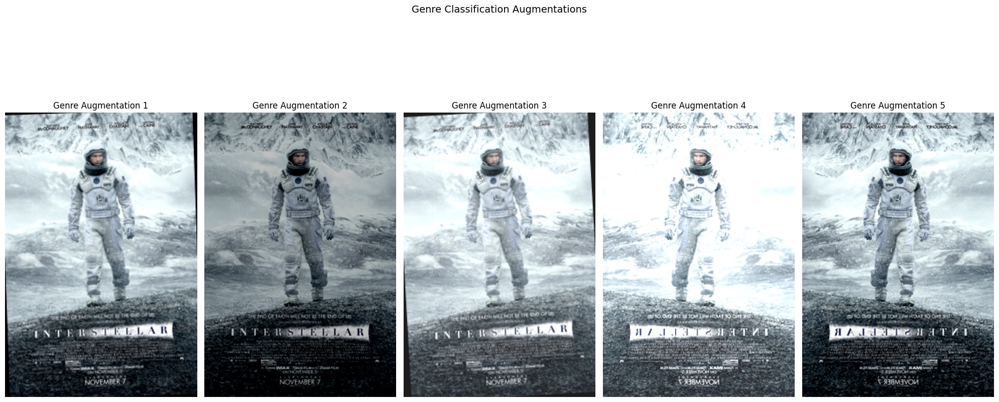

In [ ]:
# TODO: Create an augmentation pipeline that:
# 1. Preserves the overall composition (important for genre recognition)
# 2. Simulates different viewing conditions (brightness, contrast)
# 3. Is NOT too aggressive (we want to keep the poster recognizable)

genre_classification_augmentation = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=10, p=0.5),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=1)
])

# Test your pipeline

fig, axes = plt.subplots(1, 5, figsize=(20, 10))
axes = axes.flatten()

for i in range(5):
    augmented = genre_classification_augmentation(image=sample_image)['image']
    axes[i].imshow(cv2.cvtColor(augmented, cv2.COLOR_BGR2RGB))
    axes[i].set_title(f"Genre Augmentation {i+1}")
    axes[i].axis('off')

plt.suptitle("Genre Classification Augmentations", fontsize=14)
plt.tight_layout()
plt.show()


### Question 2.3: Advanced Augmentations (Cutout, MixUp)

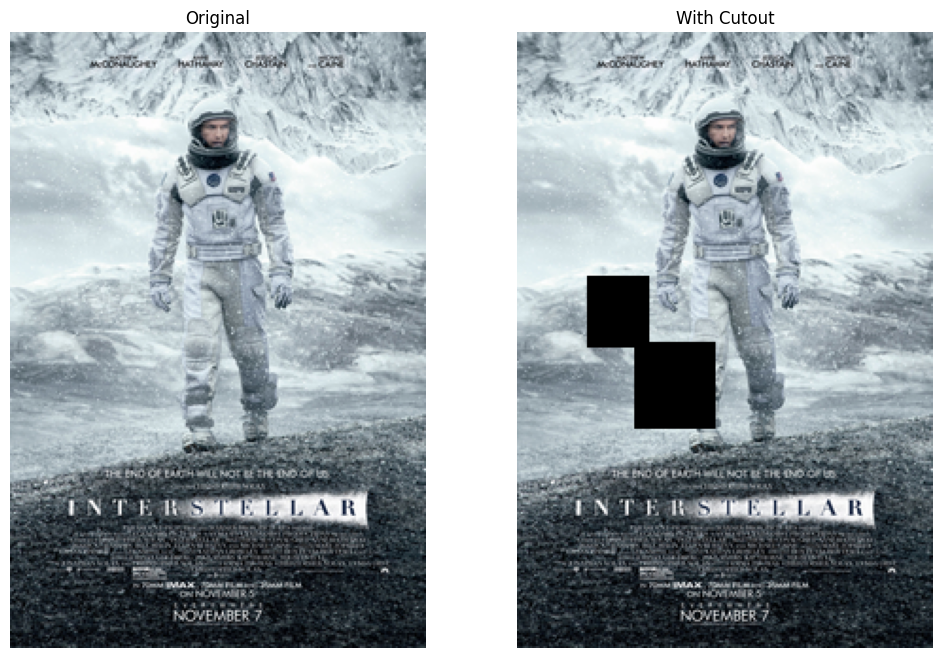

In [ ]:
# Cutout (CoarseDropout in Albumentations)
cutout_transform = A.CoarseDropout(
    max_holes=8,
    max_height=50,
    max_width=50,
    min_holes=4,
    min_height=20,
    min_width=20,
    fill_value=0,
    p=1.0
)

# Apply and show
cutout_image = cutout_transform(image=sample_image)['image']

fig, axes = plt.subplots(1, 2, figsize=(12, 8))
axes[0].imshow(cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original")
axes[0].axis('off')
axes[1].imshow(cv2.cvtColor(cutout_image, cv2.COLOR_BGR2RGB))
axes[1].set_title("With Cutout")
axes[1].axis('off')
plt.show()

### Question 2.4: Implement MixUp

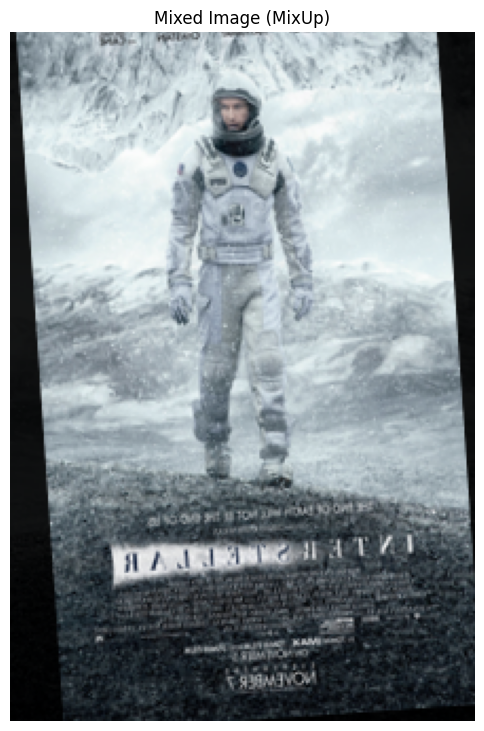

In [ ]:
# TODO: Implement MixUp augmentation
# MixUp blends two images and their labels

def mixup(image1, image2, label1, label2, alpha=0.4):
    """
    Perform MixUp augmentation.

    Args:
        image1, image2: Two images to mix
        label1, label2: Their corresponding labels (one-hot or probabilities)
        alpha: Parameter for Beta distribution

    Returns:
        mixed_image: Blended image
        mixed_label: Blended label
    """
    # Your code here
    beta = np.random.beta(alpha, alpha)
    mixed_image = (beta * image1 + (1 - beta) * image2)
    mixed_label = beta * label1 + (1 - beta) * label2
    return mixed_image, mixed_label

# For mixup, you would need two different images
# You can load another movie poster or use the same image with different augmentations
sample_image2 = poster_augmentation(image=sample_image)['image']

# Test your mixup function
mixed_image, mixed_label = mixup(sample_image, sample_image2, label1=np.array([1, 0]), label2=np.array([1, 0]), alpha=0.4)

plt.figure(figsize=(6, 9))
plt.imshow(cv2.cvtColor(mixed_image.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title("Mixed Image (MixUp)")
plt.axis('off')
plt.show()

### Question 2.5: Augmentation with Bounding Boxes

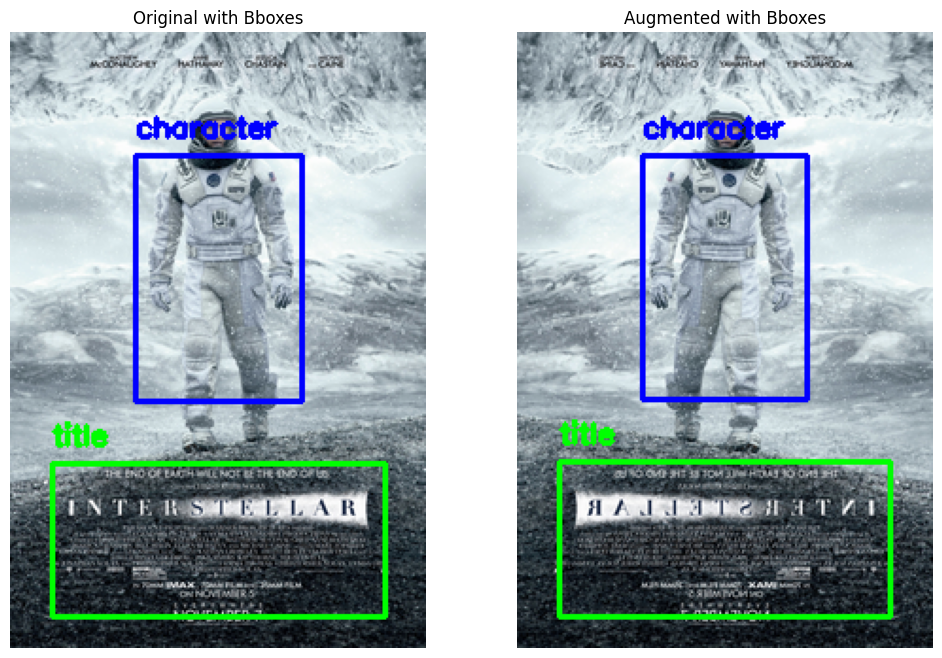

In [ ]:
# Augmentation that preserves bounding box annotations
# Use the Interstellar poster for this demo
bbox_demo_image = sample_image.copy()

bbox_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=15, p=0.5),
    A.RandomBrightnessContrast(p=0.3),
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

# Get image dimensions
height, width = bbox_demo_image.shape[:2]

# Sample bounding boxes for Interstellar poster [x_min, y_min, x_max, y_max]
# These are approximate regions for the poster elements
bboxes = [
    [int(width*0.1), int(height*0.7), int(width*0.9), int(height*0.95)],   # Title area at bottom
    [int(width*0.3), int(height*0.2), int(width*0.7), int(height*0.6)],    # Central figure
]
labels = ['title', 'character']

# Apply transform
transformed = bbox_transform(
    image=bbox_demo_image,
    bboxes=bboxes,
    labels=labels
)

# Draw bounding boxes
def draw_bboxes(image, bboxes, labels):
    img = image.copy()
    colors = {'title': (0, 255, 0), 'character': (255, 0, 0)}
    for bbox, label in zip(bboxes, labels):
        x1, y1, x2, y2 = [int(c) for c in bbox]
        cv2.rectangle(img, (x1, y1), (x2, y2), colors.get(label, (0, 0, 255)), 2)
        cv2.putText(img, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, colors.get(label, (0, 0, 255)), 2)
    return img

# Display
fig, axes = plt.subplots(1, 2, figsize=(12, 8))

orig_with_boxes = draw_bboxes(bbox_demo_image, bboxes, labels)
axes[0].imshow(cv2.cvtColor(orig_with_boxes, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original with Bboxes")
axes[0].axis('off')

aug_with_boxes = draw_bboxes(transformed['image'], transformed['bboxes'], transformed['labels'])
axes[1].imshow(cv2.cvtColor(aug_with_boxes, cv2.COLOR_BGR2RGB))
axes[1].set_title("Augmented with Bboxes")
axes[1].axis('off')

plt.show()

---

## Part 3: Text Augmentation with nlpaug

### 3.1 Setting Up nlpaug

In [ ]:
import nlpaug.augmenter.word as naw
import nlpaug.augmenter.char as nac
import nlpaug.augmenter.sentence as nas

# Sample movie reviews
sample_reviews = [
    "This movie was absolutely fantastic! A must-watch.",
    "Terrible film. Waste of time and money.",
    "The acting was superb, but the plot was confusing.",
    "One of the best movies I have seen this year.",
    "Boring and predictable. Would not recommend.",
]

print("Sample reviews:")
for i, review in enumerate(sample_reviews):
    print(f"{i+1}. {review}")

Sample reviews:
1. This movie was absolutely fantastic! A must-watch.
2. Terrible film. Waste of time and money.
3. The acting was superb, but the plot was confusing.
4. One of the best movies I have seen this year.
5. Boring and predictable. Would not recommend.


### Question 3.1 (Solved): Synonym Augmentation

In [ ]:
# Download WordNet data for NLTK
import nltk
from nltk.corpus import wordnet

# Download required NLTK data
nltk.download('wordnet')
nltk.download('omw-1.4')  # Open Multilingual WordNet
nltk.download('averaged_perceptron_tagger')  # For POS tagging (legacy)
nltk.download('averaged_perceptron_tagger_eng')  # For POS tagging (newer version)

print("WordNet data downloaded successfully!")

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...


WordNet data downloaded successfully!


[nltk_data]   Unzipping taggers/averaged_perceptron_tagger_eng.zip.


In [ ]:
# SOLVED: Synonym replacement augmentation

# Workaround for nlpaug internal bugs - patch missing imports
import nltk
from nltk.corpus import wordnet as wn

# Patch nlpaug's wordnet module to fix missing imports
import nlpaug.model.word_dict.wordnet as nlpaug_wordnet
nlpaug_wordnet.wordnet = wn
nlpaug_wordnet.nltk = nltk

# Create synonym augmenter using WordNet
synonym_aug = naw.SynonymAug(aug_src='wordnet', aug_max=3)

print("Synonym Augmentation Examples:\n")
for review in sample_reviews[:3]:
    augmented = synonym_aug.augment(review)
    print(f"Original: {review}")
    print(f"Augmented: {augmented[0]}")
    print()

Synonym Augmentation Examples:

Original: This movie was absolutely fantastic! A must-watch.
Augmented: This picture show be absolutely marvellous! A must - watch.

Original: Terrible film. Waste of time and money.
Augmented: Terrible film. Wastefulness of clip and money.

Original: The acting was superb, but the plot was confusing.
Augmented: The acting constitute superb, merely the plot be confusing.



### Question 3.2: Random Word Operations

In [ ]:
# TODO: Try different word-level augmentations:
# 1. Random word deletion
# 2. Random word swap
# 3. Random word insertion

import nlpaug.augmenter.word as naw

# Your code here
def random_word_deletion(text, p=0.1):
    return naw.RandomWordAug(action="delete", aug_p=p).augment(text)

def random_word_swap(text, p=0.1):
    return naw.RandomWordAug(action="swap", aug_p=p).augment(text)

def random_word_insertion(text, n_insertions=1):
    aug = naw.SynonymAug(aug_src='wordnet', aug_max=n_insertions)
    return aug.augment(text)

# Test the new augmentations
print("Random Word Deletion Examples:\n")
for review in sample_reviews[:3]:
    augmented = random_word_deletion(review, p=0.2)
    print(f"Original: {review}")
    print(f"Augmented: {augmented[0]}")
    print()

print("Random Word Swap Examples:\n")
for review in sample_reviews[:3]:
    augmented = random_word_swap(review, p=0.1)
    print(f"Original: {review}")
    print(f"Augmented: {augmented[0]}")
    print()

print("Random Word Insertion Examples:\n")
for review in sample_reviews[:3]:
    augmented = random_word_insertion(review, n_insertions=2)
    print(f"Original: {review}")
    print(f"Augmented: {augmented[0]}")
    print()

Random Word Deletion Examples:

Original: This movie was absolutely fantastic! A must-watch.
Augmented: This movie was! A - watch.

Original: Terrible film. Waste of time and money.
Augmented: Terrible film. Waste of money.

Original: The acting was superb, but the plot was confusing.
Augmented: Acting was superb, but plot was confusing.

Random Word Swap Examples:

Original: This movie was absolutely fantastic! A must-watch.
Augmented: This movie was absolutely fantastic! A must - watch.

Original: Terrible film. Waste of time and money.
Augmented: Terrible film. Waste time of and money.

Original: The acting was superb, but the plot was confusing.
Augmented: The acting was, superb but plot the was confusing.

Random Word Insertion Examples:

Original: This movie was absolutely fantastic! A must-watch.
Augmented: This moving picture show was absolutely fantastic! A must - vigil.

Original: Terrible film. Waste of time and money.
Augmented: Terrible film. Waste of time and money.

Orig

### Question 3.3: Contextual Word Embeddings (BERT)

In [ ]:
# Contextual augmentation using BERT
# Note: This requires downloading the BERT model (may take a few minutes)

try:
    bert_aug = naw.ContextualWordEmbsAug(
        model_path='bert-base-uncased',
        action='substitute',
        aug_max=2
    )

    print("BERT Contextual Augmentation:\n")
    for review in sample_reviews[:2]:
        augmented = bert_aug.augment(review)
        print(f"Original: {review}")
        print(f"Augmented: {augmented[0]}")
        print()

except Exception as e:
    print(f"BERT augmentation not available: {e}")
    print("Try: pip install transformers torch")

BERT augmentation not available: BertTokenizer has no attribute _convert_token_to_id
Try: pip install transformers torch


### Question 3.4: Character-Level Augmentation

In [ ]:
# Character-level augmentation (simulating typos)

# Keyboard typo augmenter
keyboard_aug = nac.KeyboardAug(aug_char_max=2, aug_word_max=2)

# OCR error augmenter
ocr_aug = nac.OcrAug(aug_char_max=2, aug_word_max=2)

print("Character-Level Augmentation Examples:\n")

review = sample_reviews[0]
print(f"Original: {review}")
print(f"Keyboard typos: {keyboard_aug.augment(review)[0]}")
print(f"OCR errors: {ocr_aug.augment(review)[0]}")

Character-Level Augmentation Examples:

Original: This movie was absolutely fantastic! A must-watch.
Keyboard typos: %hiW movie was absolutely fantastic! A must - wa5cm.
OCR errors: This movie was absolutely fantastic! A must - watch.


### Question 3.5: Create a Complete Text Augmentation Pipeline

In [ ]:
# TODO: Create a pipeline that applies multiple augmentations
# Use naf.Sequential or naf.Sometimes for probabilistic application

import nlpaug.flow as naf

def create_text_augmentation_pipeline():
    """
    Create a text augmentation pipeline for movie review sentiment.

    Requirements:
    - Should preserve sentiment (don't replace sentiment words)
    - Should maintain readability
    - Should be diverse
    """
    # Your code here

    sentiment_stopwords = [
        "good", "great", "excellent", "amazing", "awesome",
        "bad", "terrible", "awful", "worst", "boring",
        "love", "hate", "liked", "disliked"
    ]

    pipeline = naf.Sequential([
        naf.Sometimes(naw.SynonymAug(aug_src='wordnet', aug_max=2, stopwords=sentiment_stopwords), aug_p=0.5),
        naf.Sometimes(naw.RandomWordAug(action="swap", aug_p=0.1), aug_p=0.3),
        naf.Sometimes(naw.RandomWordAug(action="delete", aug_p=0.1), aug_p=0.3)
    ])
    return pipeline

# Test your pipeline
text_augmentation_pipeline = create_text_augmentation_pipeline()
for review in sample_reviews[:3]:
    augmented = text_augmentation_pipeline.augment(review)
    while isinstance(augmented, list):
      augmented = augmented[0]

    if not augmented:
      augmented = review

    print(f"Original: {review}")
    print(f"Augmented: {augmented}")
    print()

Original: This movie was absolutely fantastic! A must-watch.
Augmented: This movie dead! A - mustiness watch.

Original: Terrible film. Waste of time and money.
Augmented: Terrible film. Waste of and time.

Original: The acting was superb, but the plot was confusing.
Augmented: The acting comprise superb, only the plot was confusing.



### Question 3.6: Back-Translation (Advanced)

In [ ]:
!pip install transformers torch sentencepiece protobuf sacremoses

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.5/897.5 kB 13.6 MB/s eta 0:00:00


In [ ]:
# Back-translation: English -> Other Language -> English
# This requires downloading translation models

try:
    back_trans_aug = naw.BackTranslationAug(
        from_model_name='facebook/wmt19-en-de',
        to_model_name='facebook/wmt19-de-en'
    )

    print("Back-Translation Augmentation:\n")
    review = "This movie was absolutely fantastic!"
    augmented = back_trans_aug.augment(review)
    print(f"Original: {review}")
    print(f"Back-translated: {augmented[0]}")

except Exception as e:
    print(f"Back-translation not available: {e}")
    print("Requires: pip install transformers torch sentencepiece")

Back-Translation Augmentation:

Original: This movie was absolutely fantastic!
Back-translated: This movie was absolutely fantastic!


---

## Part 4: Audio Augmentation

### 4.1 Creating Sample Audio

Download complete!
Successfully loaded 'Quick Brown Fox' audio from local file.
Audio shape: (168192,)
Sample rate: 44100 Hz
Duration: 3.81 seconds


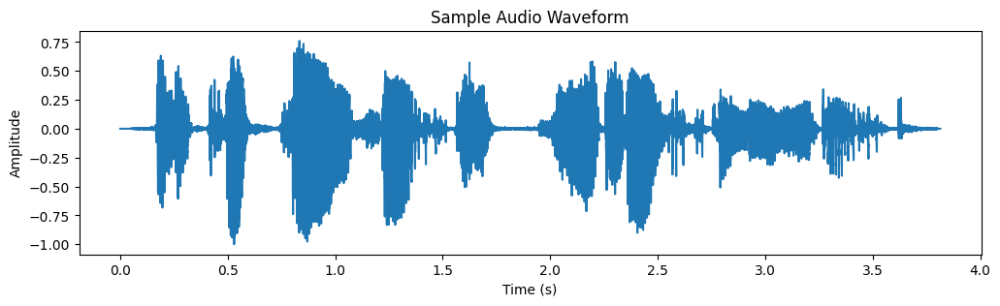


Playing audio...


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import soundfile as sf

# Download "The Quick Brown Fox" audio if not already present
local_audio_path = "Audio_Sample_-_The_Quick_Brown_Fox_Jumps_Over_The_Lazy_Dog.ogg"

if not os.path.exists(local_audio_path):
    print("Downloading 'Quick Brown Fox' audio sample...")
    !wget -q "https://upload.wikimedia.org/wikipedia/commons/a/a1/Audio_Sample_-_The_Quick_Brown_Fox_Jumps_Over_The_Lazy_Dog.ogg"
    print("Download complete!")

# Load the audio file
sample_audio, sr = sf.read(local_audio_path)

# Convert to mono if stereo
if len(sample_audio.shape) > 1:
    sample_audio = sample_audio.mean(axis=1)

# Convert to float32 and normalize
sample_audio = sample_audio.astype(np.float32)
sample_audio = sample_audio / np.max(np.abs(sample_audio))

print("Successfully loaded 'Quick Brown Fox' audio from local file.")

print(f"Audio shape: {sample_audio.shape}")
print(f"Sample rate: {sr} Hz")
print(f"Duration: {len(sample_audio) / sr:.2f} seconds")

# Plot waveform
plt.figure(figsize=(12, 3))
plt.plot(np.linspace(0, len(sample_audio)/sr, len(sample_audio)), sample_audio)
plt.title("Sample Audio Waveform")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()

# Play the audio
from IPython.display import Audio, display
print("\nPlaying audio...")
display(Audio(sample_audio, rate=sr))

### Question 4.1: Basic Audio Augmentations

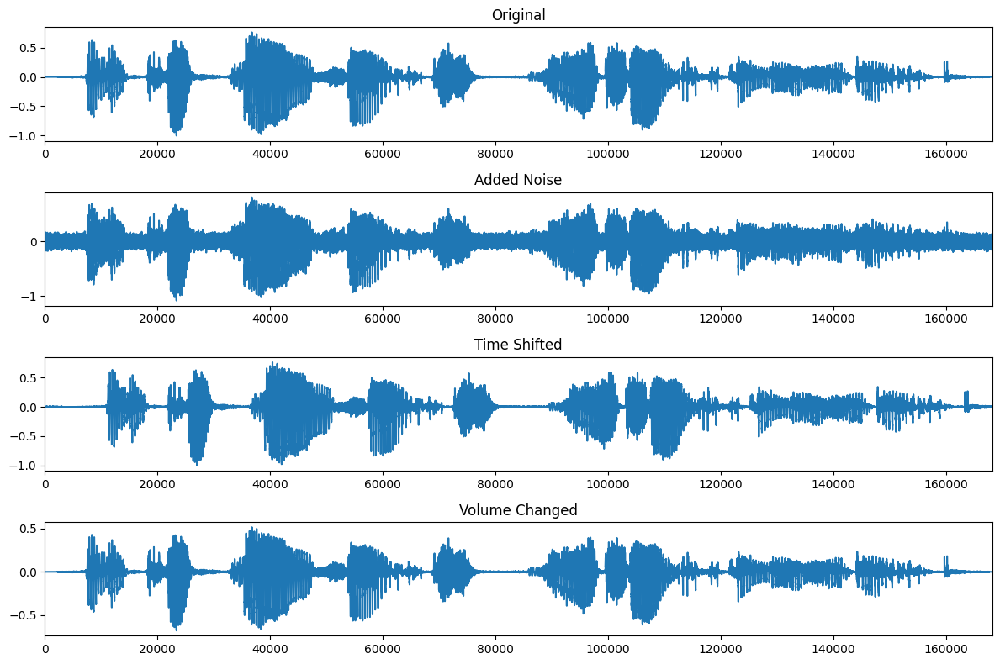


Playing augmented audio samples...

Original:



Added Noise:



Time Shifted:



Volume Changed:


In [ ]:
# Manual audio augmentations

def add_noise(audio, noise_level=0.01):
    """Add Gaussian noise to audio."""
    noise = np.random.randn(len(audio)) * noise_level
    return audio + noise

def time_shift(audio, shift_range=0.2):
    """Shift audio in time."""
    shift = int(len(audio) * shift_range * np.random.uniform(-1, 1))
    return np.roll(audio, shift)

def change_volume(audio, volume_range=(0.5, 1.5)):
    """Change audio volume."""
    volume = np.random.uniform(*volume_range)
    return audio * volume

def pitch_shift_simple(audio, shift_factor=0.1):
    """Simple pitch shift by resampling."""
    from scipy.signal import resample
    factor = 1 + np.random.uniform(-shift_factor, shift_factor)
    new_length = int(len(audio) / factor)
    shifted = resample(audio, new_length)
    # Pad or trim to original length
    if len(shifted) > len(audio):
        return shifted[:len(audio)]
    else:
        return np.pad(shifted, (0, len(audio) - len(shifted)))

# Apply augmentations
augmentations = {
    'Original': sample_audio,
    'Added Noise': add_noise(sample_audio, 0.05),
    'Time Shifted': time_shift(sample_audio, 0.1),
    'Volume Changed': change_volume(sample_audio, (0.5, 1.5)),
}

# Plot
fig, axes = plt.subplots(4, 1, figsize=(12, 8))
for idx, (name, audio) in enumerate(augmentations.items()):
    axes[idx].plot(audio)
    axes[idx].set_title(name)
    axes[idx].set_xlim(0, len(audio))
plt.tight_layout()
plt.show()

# Play each augmented audio
from IPython.display import Audio, display
print("\nPlaying augmented audio samples...")
for name, audio in augmentations.items():
    print(f"\n{name}:")
    display(Audio(audio, rate=sr))

### Question 4.2: Implement SpecAugment

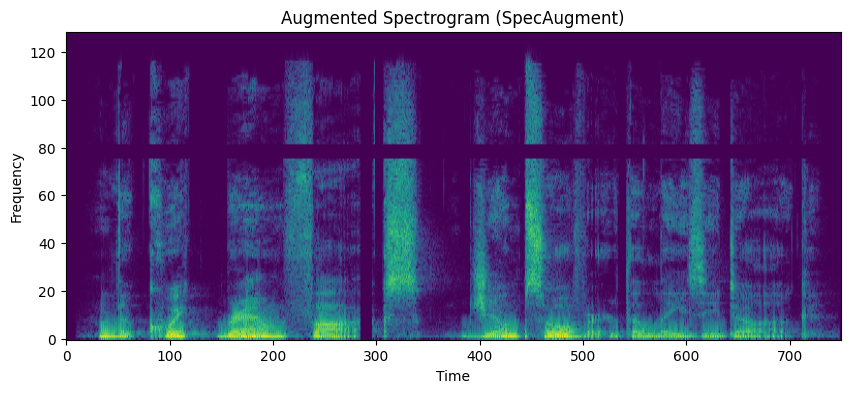

In [ ]:
# TODO: Implement SpecAugment (frequency and time masking on spectrograms)

from scipy.signal import spectrogram

def spec_augment(audio, sr, freq_mask_param=10, time_mask_param=20):
    """
    Apply SpecAugment to audio.

    Args:
        audio: Audio signal
        sr: Sample rate
        freq_mask_param: Maximum frequency mask width
        time_mask_param: Maximum time mask width

    Returns:
        Augmented spectrogram
    """
    # Your code here
    f, t, Sxx = spectrogram(audio, fs=sr)
    n_freq, n_time = Sxx.shape

    f_width = np.random.randint(0, freq_mask_param)
    f_start = np.random.randint(0, n_freq - f_width)
    Sxx[f_start:f_start+f_width, :] = 0

    t_width = np.random.randint(0, time_mask_param)
    t_start = np.random.randint(0, n_time - t_width)
    Sxx[:, t_start:t_start+t_width] = 0

    return Sxx

# Test your function
augmented_spec = spec_augment(sample_audio, sr)
fig, ax = plt.subplots(figsize=(10, 4))
ax.imshow(10 * np.log10(augmented_spec + 1e-10), aspect='auto', origin='lower')
ax.set_title("Augmented Spectrogram (SpecAugment)")
ax.set_xlabel("Time")
ax.set_ylabel("Frequency")
plt.show()

---

## Part 5: Measuring Augmentation Impact

### 5.1 Setting Up a Classification Task

In [ ]:
pip install scikit-learn

In [ ]:
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Load a small subset of 20 newsgroups
categories = ['rec.sport.baseball', 'rec.sport.hockey']
newsgroups = fetch_20newsgroups(subset='all', categories=categories,
                                 remove=('headers', 'footers', 'quotes'))

# Limit to smaller dataset for demonstration
texts = newsgroups.data[:500]
labels = newsgroups.target[:500]

# Split
X_train, X_test, y_train, y_test = train_test_split(
    texts, labels, test_size=0.3, random_state=42
)

print(f"Training samples: {len(X_train)}")
print(f"Test samples: {len(X_test)}")

Training samples: 350
Test samples: 150


### Question 5.1 (Solved): Baseline Without Augmentation

In [ ]:
# SOLVED: Train baseline model without augmentation

# Vectorize
vectorizer = TfidfVectorizer(max_features=1000, stop_words='english')
X_train_vec = vectorizer.fit_transform(X_train)
X_test_vec = vectorizer.transform(X_test)

# Train
model = LogisticRegression(max_iter=1000)
model.fit(X_train_vec, y_train)

# Evaluate
y_pred = model.predict(X_test_vec)
baseline_accuracy = accuracy_score(y_test, y_pred)

print(f"Baseline Accuracy (no augmentation): {baseline_accuracy:.2%}")

Baseline Accuracy (no augmentation): 87.33%


### Question 5.2: Train with Augmentation

In [ ]:
# TODO: Augment training data and measure improvement
# 1. Augment each training sample 2-3 times
# 2. Combine with original data
# 3. Train model
# 4. Compare accuracy

# Your code here
text_augmentation_pipeline = create_text_augmentation_pipeline()
augmented_texts = []
augmented_labels = []
for text, label in zip(X_train, y_train):
    while isinstance(text, list) and len(text) > 0:
      text = text[0]
    if not isinstance(text, str):
      continue
    augmented_texts.append(text)
    augmented_labels.append(label)
    for _ in range(2):  # Create 2 augmentations per sample
        try:
          augmented = text_augmentation_pipeline.augment(text)
          while isinstance(augmented, list) and len(augmented) > 0:
            augmented = augmented[0]
          if not augmented or not isinstance(augmented, str):
            augmented = text
        except Exception:
          augmented = text
        augmented_texts.append(augmented)
        augmented_labels.append(label)

print(f"Original training samples: {len(X_train)}")
print(f"Augmented training samples: {len(augmented_texts)}")
# Vectorize augmented data
X_train_aug_vec = vectorizer.fit_transform(augmented_texts)
# Train on augmented data
model_aug = LogisticRegression(max_iter=1000)
model_aug.fit(X_train_aug_vec, augmented_labels)
# Evaluate
X_test_vec = vectorizer.transform(X_test)
y_pred_aug = model_aug.predict(X_test_vec)
augmented_accuracy = accuracy_score(y_test, y_pred_aug)
print(f"Augmented Accuracy: {augmented_accuracy:.2%}")

Original training samples: 350
Augmented training samples: 1050
Augmented Accuracy: 88.67%


### Question 5.3: Learning Curve Comparison

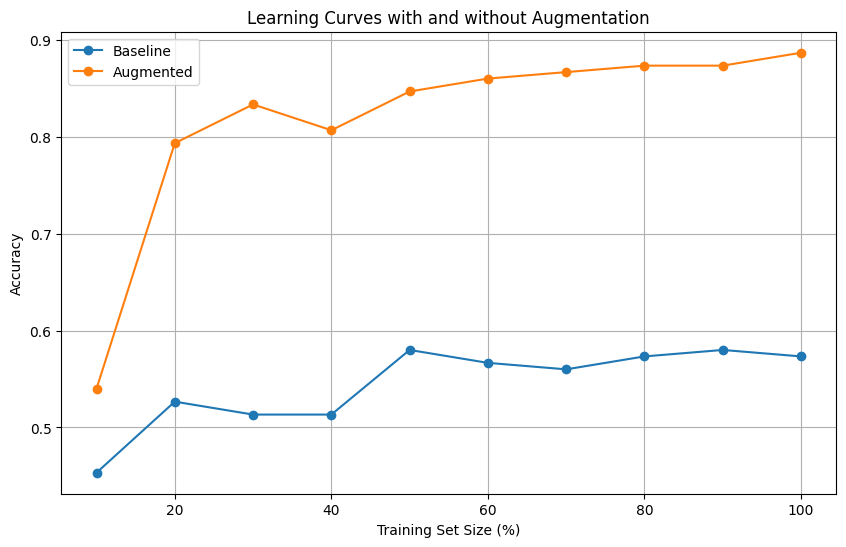

In [ ]:
# TODO: Plot learning curves with and without augmentation
# Train on 10%, 20%, ..., 100% of training data
# Compare the two curves

# Your code here
train_sizes = np.linspace(0.1, 1.0, 10)
baseline_accuracies = []
augmented_accuracies = []
for size in train_sizes:
    # Baseline
    subset_size = int(len(X_train) * size)
    model.fit(X_train_vec[:subset_size], y_train[:subset_size])
    y_pred = model.predict(X_test_vec)
    baseline_accuracies.append(accuracy_score(y_test, y_pred))

    # Augmented
    subset_aug_size = int(len(augmented_texts) * size)
    model_aug.fit(X_train_aug_vec[:subset_aug_size], augmented_labels[:subset_aug_size])
    y_pred_aug = model_aug.predict(X_test_vec)
    augmented_accuracies.append(accuracy_score(y_test, y_pred_aug))
# Plot learning curves
plt.figure(figsize=(10, 6))
plt.plot(train_sizes * 100, baseline_accuracies, label='Baseline', marker='o')
plt.plot(train_sizes * 100, augmented_accuracies, label='Augmented', marker='o')
plt.title("Learning Curves with and without Augmentation")
plt.xlabel("Training Set Size (%)")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

---

## Part 6: Best Practices and Guidelines

### Question 6.1: When NOT to Augment

In [ ]:
# Demonstration: Bad augmentation that changes the label

# Example 1: Text sentiment - replacing key sentiment words
review = "This movie was terrible"
# Bad augmentation: synonym replacement of "terrible"
bad_aug = "This movie was awesome"  # Completely changes meaning!

print("Example of BAD text augmentation:")
print(f"Original (NEGATIVE): {review}")
print(f"Bad augmentation: {bad_aug}")
print("The label changed from NEGATIVE to POSITIVE!")

print("\n" + "="*50 + "\n")

# Example 2: Digit classification with vertical flip
print("Example of BAD image augmentation:")
print("Original: Image of '6'")
print("Vertical flip: Image of '9'")
print("The label changed from '6' to '9'!")

Example of BAD text augmentation:
Original (NEGATIVE): This movie was terrible
Bad augmentation: This movie was awesome
The label changed from NEGATIVE to POSITIVE!


Example of BAD image augmentation:
Original: Image of '6'
Vertical flip: Image of '9'
The label changed from '6' to '9'!


### Question 6.2: Create an Augmentation Checklist

In [ ]:
# TODO: Write a checklist for designing augmentation pipelines

augmentation_checklist = """
# Augmentation Design Checklist

## Before Choosing Augmentations:
[ ] What is the task? (classification, detection, segmentation, etc.)
[ ] What modality? (image, text, audio, video)
[ ] What domain? (natural images, medical, documents, etc.)

## Validation Questions:
[ ] Does this augmentation preserve the label?
[ ] Is it realistic for the data distribution?
[ ] Does it introduce artifacts that could mislead the model?

## Implementation:
[ ] Start with simple augmentations and test their impact
[ ] Use libraries like Albumentations, nlpaug, torchaudio for efficient implementation
[ ] Visualize augmented samples to ensure they look reasonable
[ ] Monitor training performance with and without augmentation
[ ] Adjust augmentation parameters based on validation results

## Testing:
[ ] Evaluate on a hold-out set to measure the impact of augmentation
[ ] Plot learning curves to compare with and without augmentation
"""

# Complete the checklist
print(augmentation_checklist)


# Augmentation Design Checklist

## Before Choosing Augmentations:
[ ] What is the task? (classification, detection, segmentation, etc.)
[ ] What modality? (image, text, audio, video)
[ ] What domain? (natural images, medical, documents, etc.)

## Validation Questions:
[ ] Does this augmentation preserve the label?
[ ] Is it realistic for the data distribution?
[ ] Does it introduce artifacts that could mislead the model?

## Implementation:
[ ] Start with simple augmentations and test their impact
[ ] Use libraries like Albumentations, nlpaug, torchaudio for efficient implementation
[ ] Visualize augmented samples to ensure they look reasonable
[ ] Monitor training performance with and without augmentation
[ ] Adjust augmentation parameters based on validation results

## Testing:
[ ] Evaluate on a hold-out set to measure the impact of augmentation
[ ] Plot learning curves to compare with and without augmentation



---

## Challenge Problems

### Challenge 1: Test-Time Augmentation (TTA)

In [ ]:
# Challenge: Implement Test-Time Augmentation
# Apply augmentations at inference time and average predictions

def tta_predict(model, vectorizer, text, n_augments=5):
    """
    Make prediction using Test-Time Augmentation.

    Args:
        model: Trained classifier
        vectorizer: Fitted TfidfVectorizer
        text: Text to classify
        n_augments: Number of augmented versions to use

    Returns:
        Averaged prediction probabilities
    """
    # Your code here
    augmented_texts = [text]
    for _ in range(n_augments):
        augmented = text_augmentation_pipeline.augment(text)
        augmented_texts.append(augmented[0])
    augmented_vecs = vectorizer.transform(augmented_texts)
    probs = model.predict_proba(augmented_vecs)
    avg_probs = np.mean(probs, axis=0)
    return avg_probs

### Challenge 2: AutoAugment-Style Policy Search

In [ ]:
# Challenge: Implement a simple augmentation policy search
# Find the best combination of augmentation parameters

def normalize_text(text):
    while isinstance(text, list) and len(text) > 0:
        text = text[0]
    return text if isinstance(text, str) else ""

def create_pipeline(params):
    sentiment_stopwords = [
        "good", "great", "excellent", "amazing", "awesome",
        "bad", "terrible", "awful", "worst", "boring",
        "love", "hate", "liked", "disliked"
    ]

    return naf.Sequential([
        naf.Sometimes(
            naw.SynonymAug(
                aug_src='wordnet',
                aug_max=2,
                stopwords=sentiment_stopwords
            ),
            aug_p=params["synonym_prob"]
        ),
        naf.Sometimes(
            naw.RandomWordAug(
                action="swap",
                aug_p=params["swap_word_prob"],
                stopwords=sentiment_stopwords
            ),
            aug_p=params["swap_prob"]
        ),
        naf.Sometimes(
            naw.RandomWordAug(
                action="delete",
                aug_p=params["delete_word_prob"],
                stopwords=sentiment_stopwords
            ),
            aug_p=params["delete_prob"]
        )
    ])

def search_augmentation_policy(X_train, y_train, X_val, y_val, n_trials=20):

    best_score = 0
    best_policy = None

    # Fit vectorizer ONLY on original train
    vectorizer.fit(X_train)
    X_val_vec = vectorizer.transform(X_val)

    for trial in range(n_trials):

        # Randomly sample augmentation hyperparameters
        policy = {
            "synonym_prob": random.uniform(0.2, 0.8),
            "swap_prob": random.uniform(0.0, 0.5),
            "delete_prob": random.uniform(0.0, 0.5),
            "swap_word_prob": random.uniform(0.05, 0.2),
            "delete_word_prob": random.uniform(0.05, 0.2),
            "n_augments": random.choice([1, 2, 3])
        }

        pipeline = create_pipeline(policy)

        augmented_texts = []
        augmented_labels = []

        for text, label in zip(X_train, y_train):

            text = normalize_text(text)
            augmented_texts.append(text)
            augmented_labels.append(label)

            for _ in range(policy["n_augments"]):
                try:
                    aug_text = pipeline.augment(text)
                    aug_text = normalize_text(aug_text)
                    if not aug_text:
                        aug_text = text
                except:
                    aug_text = text

                augmented_texts.append(aug_text)
                augmented_labels.append(label)

        # Vectorize using original vocabulary
        X_train_aug_vec = vectorizer.transform(augmented_texts)

        model = LogisticRegression(max_iter=1000)
        model.fit(X_train_aug_vec, augmented_labels)

        y_pred = model.predict(X_val_vec)
        score = accuracy_score(y_val, y_pred)

        print(f"Trial {trial+1}/{n_trials} — Val Accuracy: {score:.4f}")

        if score > best_score:
            best_score = score
            best_policy = policy

    return best_policy, best_score


### Challenge 3: Augmentation for Imbalanced Classes

In [ ]:
# Challenge: Use augmentation to balance an imbalanced dataset
# More augmentation for minority classes

from collections import Counter

def class_balanced_augmentation(X, y, target_count=None):
    """
    Augment data to balance class distribution.

    Args:
        X: Features
        y: Labels
        target_count: Target number of samples per class (default: max class count)

    Returns:
        X_balanced, y_balanced: Balanced dataset
    """
    # Your code here
    class_counts = Counter(y)
    if target_count is None:
        target_count = max(class_counts.values())
    X_balanced = []
    y_balanced = []
    for cls in class_counts:
        cls_indices = [i for i, label in enumerate(y) if label == cls]
        X_cls = [X[i] for i in cls_indices]
        y_cls = [y[i] for i in cls_indices]
        X_balanced.extend(X_cls)
        y_balanced.extend(y_cls)
        n_to_augment = target_count - class_counts[cls]
        for _ in range(n_to_augment):
            idx = np.random.choice(len(X_cls))
            augmented = text_augmentation_pipeline.augment(X_cls[idx])
            X_balanced.append(augmented[0])
            y_balanced.append(cls)
    return X_balanced, y_balanced


---

## Summary

In this lab, you learned:

1. **Image Augmentation**: Geometric and color transforms with Albumentations
2. **Text Augmentation**: Synonym replacement, back-translation with nlpaug
3. **Audio Augmentation**: Time-domain and frequency-domain augmentations
4. **Pipeline Design**: Creating appropriate augmentation pipelines for tasks
5. **Impact Measurement**: Comparing model performance with/without augmentation

### Key Takeaways

| Modality | Key Transforms | Libraries |
|----------|---------------|----------|
| Image | Flip, rotate, color, cutout | Albumentations |
| Text | Synonym, back-translation | nlpaug |
| Audio | Noise, pitch, SpecAugment | audiomentations |

### Best Practices

1. **Always verify** augmentations preserve labels
2. **Start simple**, add complexity gradually
3. **Don't augment** validation/test data
4. **Measure impact** before and after
5. **Domain-specific** choices matter

### Next Week

Week 6: LLM APIs - Integrating large language models into your applications!